In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
%matplotlib inline

In [5]:
card = pd.read_csv("D:\Data Science\DataSets\Credit card Fraud\creditcard.csv")
card.shape

(284807, 31)

In [6]:
card.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [10]:
card.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [11]:
card.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [9]:
card["Class"].value_counts()

0    284315
1       492
Name: Class, dtype: int64

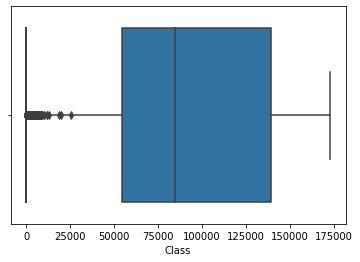

In [12]:
for i in card.columns:
    sns.boxplot(card[i])

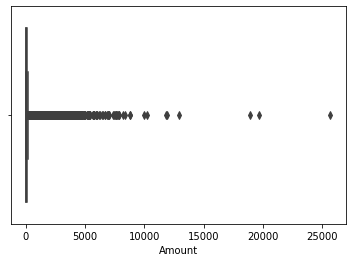

In [13]:
sns.boxplot(card["Amount"])

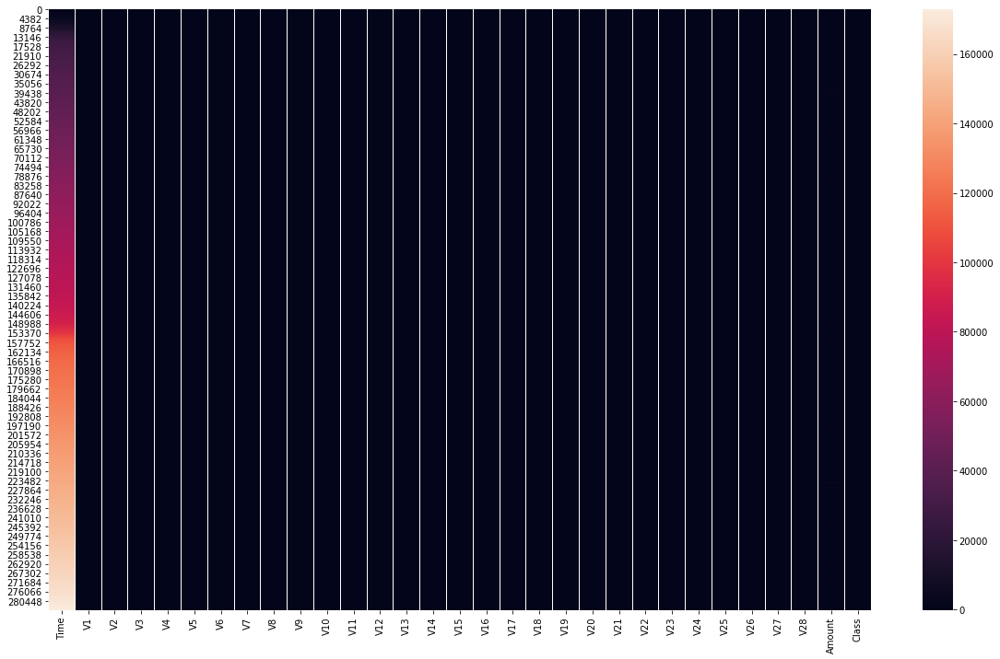

In [14]:
plt.figure(figsize=(20, 12))
sns.heatmap(card)
plt.show()

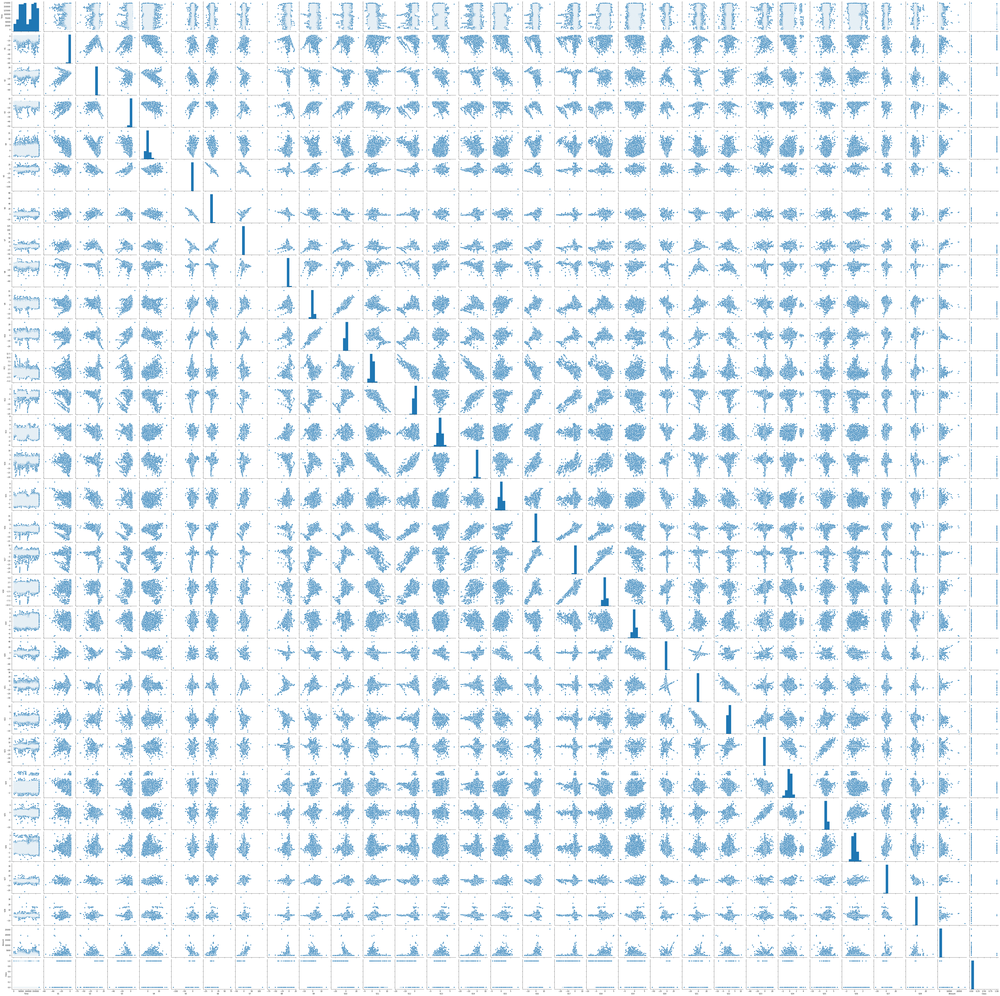

In [15]:
sns.pairplot(card)
plt.show()

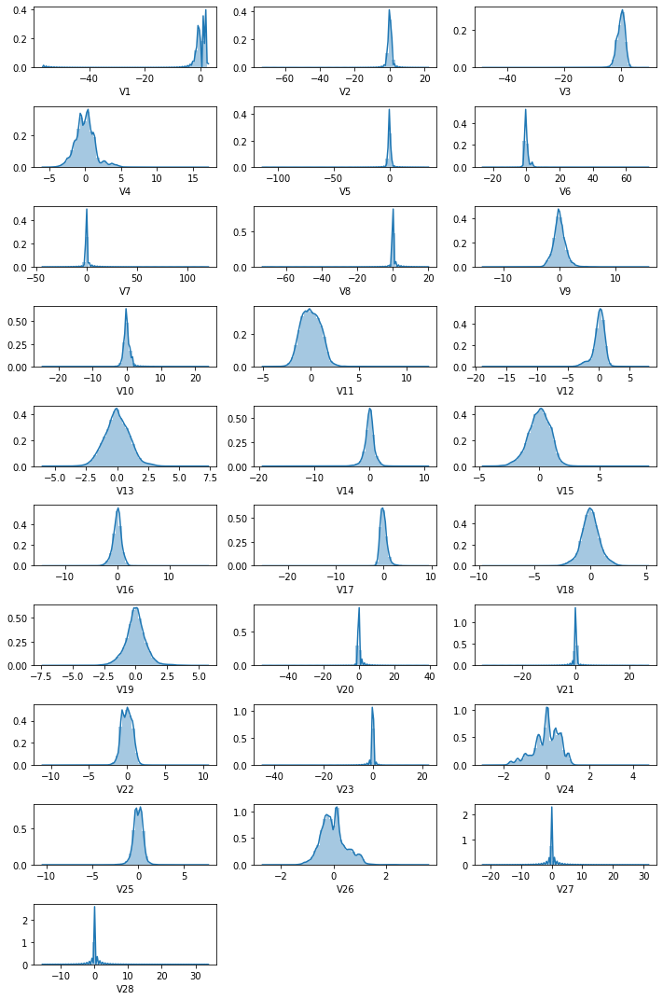

In [18]:
plt.figure(figsize=(10,15))
plotnumber = 1

for col in card.columns[1:-1]:
    if plotnumber < 29:
        plt.subplot(10,3,plotnumber)
        sns.distplot(card[col])
        plt.xlabel(col)
    plotnumber +=1
plt.tight_layout()

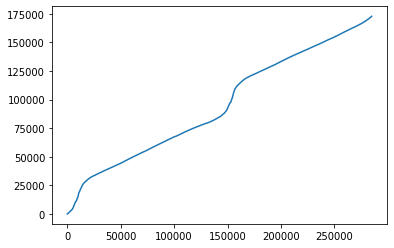

In [19]:
plt.plot(card["Time"])

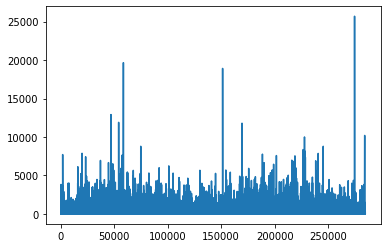

In [20]:
plt.plot(card["Amount"])

In [21]:
correlation = card.corr()

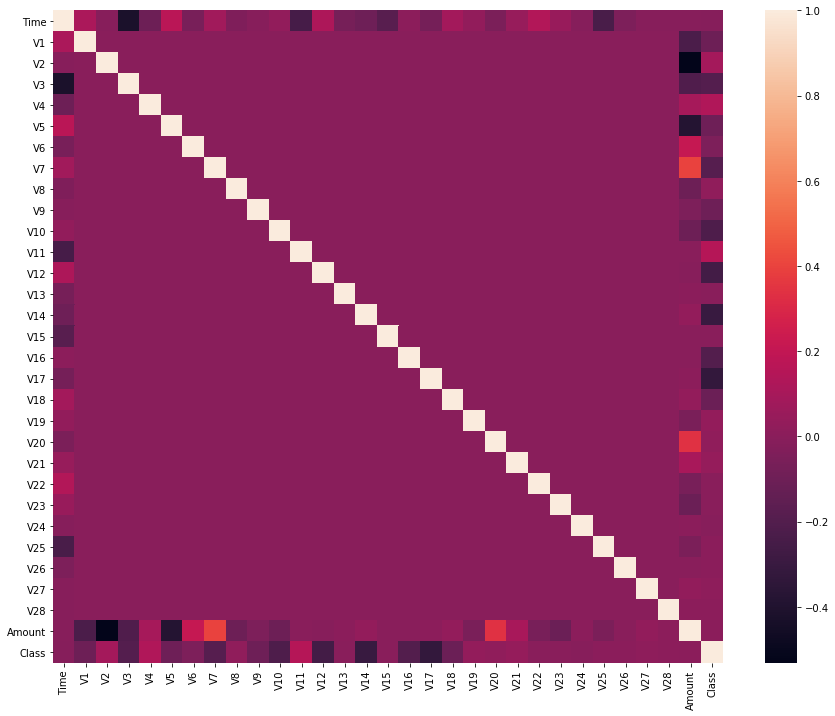

In [22]:
plt.figure(figsize=(15, 12))
sns.heatmap(correlation)
plt.show()

Text(0, 0.5, 'Frequency')

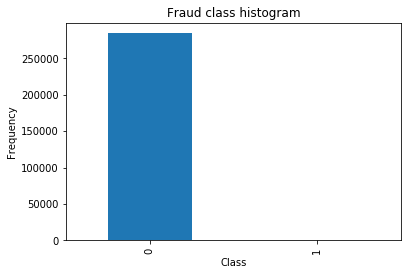

In [23]:
count_classes = pd.value_counts(card['Class'], sort = True).sort_index()
count_classes.plot(kind = 'bar')
plt.title("Fraud class histogram")
plt.xlabel("Class")
plt.ylabel("Frequency")

In [24]:
x = card.iloc[:,0:30]
y = card.iloc[:,-1]

In [25]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=0)

In [26]:
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(213605, 30) (71202, 30) (213605,) (71202,)


In [27]:
import warnings
warnings.simplefilter("ignore")

In [ ]:
from sklearn.model_selection import KFold
kf = KFold(random_state=None,shuffle=False)

In [ ]:
X = np.array(x_train)
Y = np.array(y_train)

In [28]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

Random forest classifier

In [30]:
RF_clf = RandomForestClassifier()

RF_clf.fit(x_train,y_train)

RandomForestClassifier()

In [31]:
y_pred = RF_clf.predict(x_test)

print('Confustion Matrix : \n\n', confusion_matrix(y_test,y_pred))
print('\n Accuracy Score : ',   accuracy_score(y_test,y_pred))
print('\n Classification Report : \n \n', classification_report(y_test,y_pred))

Confustion Matrix : 

 [[71076     6]
 [   25    95]]

 Accuracy Score :  0.9995646189713772

 Classification Report : 
 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     71082
           1       0.94      0.79      0.86       120

    accuracy                           1.00     71202
   macro avg       0.97      0.90      0.93     71202
weighted avg       1.00      1.00      1.00     71202



# Random forest classifier with Under Sampling

In [46]:
from collections import Counter
Counter(y_train)

Counter({0: 213233, 1: 372})

In [47]:
from imblearn.under_sampling import NearMiss

ns=NearMiss(0.8)

X_train_ns,y_train_ns=ns.fit_sample(x_train,y_train)

print("The number of classes before fit {} ".format(Counter(y_train)))
print("The number of classes after fit {} ".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 213233, 1: 372}) 
The number of classes after fit Counter({0: 465, 1: 372}) 


In [48]:
ns_RF_clf = RandomForestClassifier()

ns_RF_clf.fit(X_train_ns, y_train_ns)

RandomForestClassifier()

In [49]:
y_pred = ns_RF_clf.predict(x_test)

print('Confustion Matrix : \n\n', confusion_matrix(y_test,y_pred))
print('\n Accuracy Score : ',   accuracy_score(y_test,y_pred))
print('\n Classification Report : \n \n', classification_report(y_test,y_pred))

Confustion Matrix : 

 [[50884 20198]
 [    6   114]]

 Accuracy Score :  0.7162439257324232

 Classification Report : 
 
               precision    recall  f1-score   support

           0       1.00      0.72      0.83     71082
           1       0.01      0.95      0.01       120

    accuracy                           0.72     71202
   macro avg       0.50      0.83      0.42     71202
weighted avg       1.00      0.72      0.83     71202



# Random forest classifier with Over Sampling

In [50]:
from imblearn.over_sampling import RandomOverSampler

In [51]:
rs = RandomOverSampler(0.75)

X_train_ns, y_train_ns = rs.fit_sample(x_train, y_train)

print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 213233, 1: 372})
The number of classes after fit Counter({0: 213233, 1: 159924})


In [52]:
os_RF_clf = RandomForestClassifier()

os_RF_clf.fit(X_train_ns, y_train_ns)

RandomForestClassifier()

In [55]:
y_pred = os_RF_clf.predict(x_test)

print('Confustion Matrix : \n\n', confusion_matrix(y_test,y_pred))
print('\n Accuracy Score : ',   accuracy_score(y_test,y_pred))
print('\n Classification Report : \n \n', classification_report(y_test,y_pred))

Confustion Matrix : 

 [[71076     6]
 [   24    96]]

 Accuracy Score :  0.9995786635206876

 Classification Report : 
 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     71082
           1       0.94      0.80      0.86       120

    accuracy                           1.00     71202
   macro avg       0.97      0.90      0.93     71202
weighted avg       1.00      1.00      1.00     71202



# Random forest classifier with SMOTETomek

In [61]:
from imblearn.combine import SMOTETomek

In [63]:
smt = SMOTETomek(0.75)

X_train_ns, y_train_ns = smt.fit_sample(x_train,y_train)

print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 213233, 1: 372})
The number of classes after fit Counter({0: 212374, 1: 159065})


In [64]:
smt_RF_clf = RandomForestClassifier()

smt_RF_clf.fit(X_train_ns, y_train_ns)

RandomForestClassifier()

In [66]:
y_pred = smt_RF_clf.predict(x_test)

print('Confustion Matrix : \n\n', confusion_matrix(y_test,y_pred))
print('\n Accuracy Score : ',   accuracy_score(y_test,y_pred))
print('\n Classification Report : \n \n', classification_report(y_test,y_pred))

Confustion Matrix : 

 [[71069    13]
 [   18   102]]

 Accuracy Score :  0.9995646189713772

 Classification Report : 
 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     71082
           1       0.89      0.85      0.87       120

    accuracy                           1.00     71202
   macro avg       0.94      0.92      0.93     71202
weighted avg       1.00      1.00      1.00     71202



# Conclusion 

In [67]:
import pickle
pickle_out = open("classifier_card.pkl","wb")
pickle.dump(RandomForestClassifier, pickle_out)
pickle_out.close()